## Importing Library

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import folium


from scipy import stats
from sqlalchemy import create_engine

## Loading GIS Data

In [2]:
engine = create_engine("postgresql://postgres:0@127.0.0.1:5432/substation_planning")

### Gardu Induk

In [3]:
sql = 'SELECT * FROM gardu_induk'
gi_gdf = gpd.GeoDataFrame.from_postgis(sql, engine, geom_col='geom')
gi_gdf = gi_gdf.set_crs(epsg=4326)
gi_gdf.head()

,gid,id,gi,alamat,y,x,status,nama_group,geom
0,1,1.0,LENGKONG 2,KP. BOJONG BELAKANG PERUMAHAN METRO SERPONG,-6.340699,106.645592,RENCANA,None,POINT (106.64559 -6.34070)
1,2,2.0,SINAR HABITAT,DESA SERDANG KULON PANONGAN SERPONG,-6.311716,106.544475,RENCANA,None,POINT (106.54448 -6.31172)
2,3,3.0,MILLENIUM,JL. MILLENIUM RAYA IIA.E.2,-6.250000,106.497778,COMMITED PROJECT,None,POINT (106.49778 -6.25000)
3,4,4.0,CENGKARENG 2,-,-6.150472,106.658980,RENCANA,5,POINT (106.65898 -6.15047)
4,5,5.0,BALARAJA,"Jln. Raya Kresek Kamp Merak Balaraja, Tangerang",-6.172203,106.443223,OPERASI,None,POINT (106.44322 -6.17220)


### Gardu

In [4]:
sql = 'SELECT * FROM gardu'
gd_gdf = gpd.GeoDataFrame.from_postgis(sql, engine, geom_col='geom')
gd_gdf = gd_gdf.set_crs(epsg=4326)
gd_gdf.head()

,gid,id,kdarea,nama_area,kode_aset_,nama_gi,kode_ase_1,nama_penyu,kode_ase_2,gardu,alamat1,gps_x,gps_y,status_rc,fungsi_gar,geom
0,1,1.0,54210.0,BANDENGAN,169,PRIOK TIMUR,16902,EPSON,1021806.0,A100,PINTU AIR ANCOL,-6.128278,106.839944,TIDAK ADA,GD,POINT (106.83994 -6.12828)
1,2,2.0,54210.0,BANDENGAN,102,ANCOL,10241,BINARIA4,1024101.0,A101,PARK ROYAL,-6.126708,106.830528,TIDAK ADA,GD,POINT (106.83053 -6.12671)
2,3,3.0,54210.0,BANDENGAN,102,ANCOL,10203,BUIH,1020306.0,A102,JL KARANG BOLONG RAYA,-6.127750,106.828160,TIDAK ADA,GD,POINT (106.82816 -6.12775)
3,4,4.0,54210.0,BANDENGAN,169,PRIOK TIMUR,16901,ACER,1360511.0,A104,PT RUKINDO,-6.115457,106.862986,TIDAK ADA,GD,POINT (106.86299 -6.11546)
4,5,5.0,54210.0,BANDENGAN,102,ANCOL,10226,ATOL,1022601.0,A105,JL.ANCOL BARAT,-6.129520,106.819940,TIDAK ADA,GD,POINT (106.81994 -6.12952)


### Fix Irregular Data

In [5]:
from shapely.geometry import Point
# Fix irregular data
gd_gdf.loc[7388, 'gps_y'] = 106.571686
gd_gdf.loc[7388, 'geom'] = Point(106.571686, -6.193717)

gd_gdf.loc[13213, 'gps_y'] = 106.91328
gd_gdf.loc[13213, 'geom'] = Point(106.91328, -6.21291)

gd_gdf.loc[13363, 'gps_x'] = -6.273780
gd_gdf.loc[13363, 'gps_y'] = 106.623180
gd_gdf.loc[13363, 'geom'] = Point(106.623180, -6.273780)

### Area

In [6]:
bts_area_query = 'SELECT * FROM bts_area'
bts_area = gpd.GeoDataFrame.from_postgis(bts_area_query, engine, geom_col='geom')
bts_area = bts_area.set_crs(epsg=4326)
bts_area.head()

,gid,id,nama_kp,aj,nama_area,kd_kp,kd_area,geom
0,1,2.0,CISOKA,TANGERANG,CIKUPA,None,None,"MULTIPOLYGON (((106.42726 -6.34421, 106.42675 ..."
1,2,3.0,CIKUPA,TANGERANG,CIKUPA,None,None,"MULTIPOLYGON (((106.46046 -6.12770, 106.46506 ..."
2,3,4.0,CURUG,TANGERANG,SERPONG,None,None,"MULTIPOLYGON (((106.49307 -6.30448, 106.49360 ..."
3,4,5.0,CIKOKOL,TANGERANG,CIKOKOL,None,None,"MULTIPOLYGON (((106.68516 -6.17034, 106.68507 ..."
4,5,8.0,SEPATAN,TANGERANG,TELUK NAGA,None,None,"MULTIPOLYGON (((106.58791 -6.02855, 106.58957 ..."


## Remove Outlayers

In [7]:
z_lon = np.abs(stats.zscore(gd_gdf['gps_x']))

outlier_x = np.where(z_lon > 3)
gd_gdf.drop(outlier_x[0], inplace=True)

In [8]:
z_lat = np.abs(stats.zscore(gd_gdf['gps_y']))

outlier_y = np.where(z_lat > 3)
gd_gdf.drop(outlier_y[0], inplace=True)


## Calculate Distance from GD to GI]

In [9]:
sql = "SELECT gardu.id AS id, gardu_induk.id AS gi_id, gardu_induk.gi AS area_gi, ST_Distance(gardu.geom, gardu_induk.geom) AS gi_distance FROM gardu CROSS JOIN gardu_induk"
temp_df = pd.read_sql_query(sql, engine)

temp_df.head()

,id,gi_id,area_gi,gi_distance
0,1.0,1.0,LENGKONG 2,0.287916
1,1.0,2.0,SINAR HABITAT,0.347781
2,1.0,3.0,MILLENIUM,0.363172
3,1.0,4.0,CENGKARENG 2,0.182320
4,1.0,5.0,BALARAJA,0.399145


## Sorting data of Gardu Disitribusi by nearest Gardu Induk

In [10]:
temp_df = temp_df.sort_values('gi_distance').drop_duplicates('id')

temp_df.head()

,id,gi_id,area_gi,gi_distance
732160,8135.0,11.0,CSW,0.000049
1576636,17519.0,17.0,GEDUNG POLA,0.000076
53129,591.0,30.0,MANGGA BESAR,0.000099
845932,9399.0,23.0,KELAPA GADING,0.000126
846022,9400.0,23.0,KELAPA GADING,0.000126


## Adding distance of Gardu Induk to Gardu Distribusi

In [11]:
gardu_distance_df  = gd_gdf.merge(temp_df, on='id', how='left')
gardu_distance_gdf = gpd.GeoDataFrame(gardu_distance_df)
gardu_distance_gdf = gardu_distance_gdf.set_crs(epsg=4326)
# Display the head of the GeoDataFrame
gardu_distance_gdf.head()

,gid,id,kdarea,nama_area,kode_aset_,nama_gi,kode_ase_1,nama_penyu,kode_ase_2,gardu,alamat1,gps_x,gps_y,status_rc,fungsi_gar,geom,gi_id,area_gi,gi_distance
0,1,1.0,54210.0,BANDENGAN,169,PRIOK TIMUR,16902,EPSON,1021806.0,A100,PINTU AIR ANCOL,-6.128278,106.839944,TIDAK ADA,GD,POINT (106.83994 -6.12828),63.0,GUNUNG SAHARI,0.008835
1,2,2.0,54210.0,BANDENGAN,102,ANCOL,10241,BINARIA4,1024101.0,A101,PARK ROYAL,-6.126708,106.830528,TIDAK ADA,GD,POINT (106.83053 -6.12671),63.0,GUNUNG SAHARI,0.004456
2,3,3.0,54210.0,BANDENGAN,102,ANCOL,10203,BUIH,1020306.0,A102,JL KARANG BOLONG RAYA,-6.127750,106.828160,TIDAK ADA,GD,POINT (106.82816 -6.12775),55.0,ANCOL,0.003953
3,4,4.0,54210.0,BANDENGAN,169,PRIOK TIMUR,16901,ACER,1360511.0,A104,PT RUKINDO,-6.115457,106.862986,TIDAK ADA,GD,POINT (106.86299 -6.11546),57.0,PRIOK TIMUR,0.005156
4,5,5.0,54210.0,BANDENGAN,102,ANCOL,10226,ATOL,1022601.0,A105,JL.ANCOL BARAT,-6.129520,106.819940,TIDAK ADA,GD,POINT (106.81994 -6.12952),55.0,ANCOL,0.006682


## Loading data from the GeoDataFrame to PostGIS

In [12]:
gardu_distance_gdf.to_postgis("gd_cluster", engine, if_exists='replace', index=False)

## Kmeans Clustering without Polygon

In [90]:
sql = """
SELECT ST_Centroid(ST_Collect(gd_cluster.geom)) AS geom, gd_cluster.area_gi 
FROM (
    SELECT ST_ClusterKMeans(geom, 5) OVER () as cluster_id, geom, area_gi
    FROM gd_cluster
) AS gd_cluster
GROUP BY gd_cluster.area_gi, gd_cluster.cluster_id
"""


# Execute the query and create a new GeoDataFrame with the cluster assignments
ch_gdf = gpd.read_postgis(sql, engine, geom_col='geom')

# Display the first few rows of the resulting GeoDataFrame
print(ch_gdf.head())

                         geom      area_gi
0  POINT (106.82581 -6.22803)          AGP
1  POINT (106.81739 -6.21537)       AGP II
2  POINT (106.64871 -6.24037)  ALAM SUTERA
3  POINT (106.66861 -6.25790)  ALAM SUTERA
4  POINT (106.66584 -6.23329)  ALAM SUTERA


In [91]:
ch_gdf = ch_gdf.set_crs('EPSG:4326')
gardu_distance_gdf= gardu_distance_gdf.set_crs('EPSG:4326') 
gardu_join = gpd.sjoin(gardu_distance_gdf, ch_gdf, predicate='intersects')
gardu_count = gardu_join.groupby('index_right').size().reset_index(name='jumlah_gd')

ch_count = ch_gdf.merge(gardu_count, left_index=True, right_on='index_right')
ch_count = ch_count.drop(columns='index_right')

ch_count.head()

,geom,area_gi,jumlah_gd
0,POINT (106.63520 -6.16659),CENGKARENG,1
1,POINT (106.57169 -6.19372),MINIATUR,1


<Axes: >

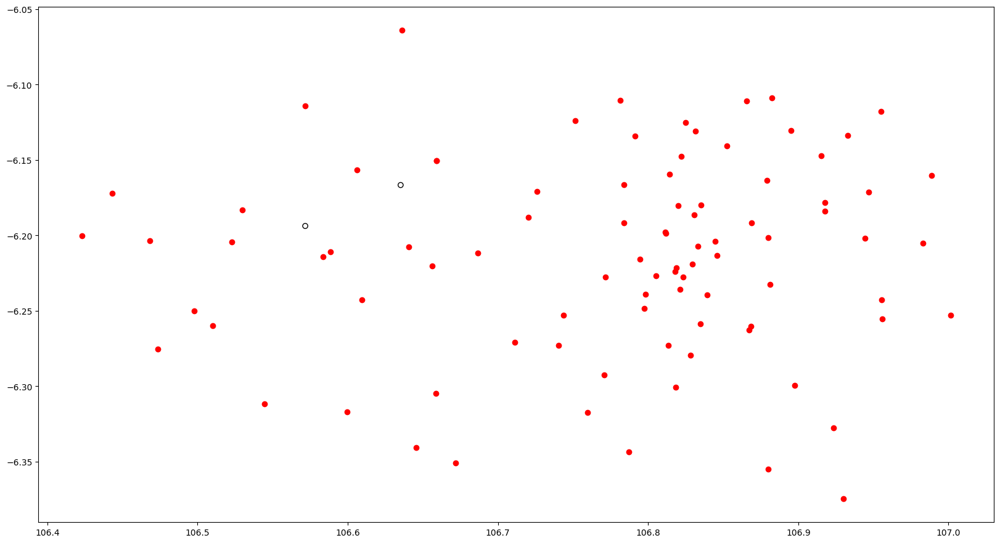

In [92]:
ax = ch_count.plot(figsize=(20, 20), color='none', edgecolor='black', zorder=3)
gi_gdf.plot(ax=ax, color='red')

## Perform Clustering Kmeans and ConvexHull Polygon

Because Kmeans output is a Point. Thereby, need another algoritm for converting the Point from Kmeans to Polygon. For Instance using Convex Hull, Concave Hull, and Voronoi as well

In [140]:
# Define the SQL query to perform the clustering
query = """
SELECT ST_ConvexHull(ST_Collect(ST_Centroid(gd_cluster.geom))) AS geom, gd_cluster.area_gi, gd_cluster.cluster_id
FROM (
    SELECT ST_ClusterKMeans(geom, 2) OVER () as cluster_id, geom, area_gi
    FROM gd_cluster
) AS gd_cluster
GROUP BY gd_cluster.area_gi, gd_cluster.cluster_id
"""

# Execute the query and create a new GeoDataFrame with the cluster assignments
ch_gdf = gpd.read_postgis(query, engine, geom_col='geom')

# Display the first few rows of the resulting GeoDataFrame
print(ch_gdf.head())

                                                geom      area_gi  cluster_id
0  POLYGON ((106.83008 -6.23198, 106.82619 -6.231...          AGP           0
1  POLYGON ((106.82242 -6.22234, 106.81554 -6.221...       AGP II           0
2  POLYGON ((106.66068 -6.26228, 106.64938 -6.260...  ALAM SUTERA           1
3  POLYGON ((106.82092 -6.13598, 106.81766 -6.135...        ANCOL           0
4  POLYGON ((106.79640 -6.15237, 106.76838 -6.145...        ANGKE           0


In [141]:
ch_gdf = ch_gdf.set_crs('EPSG:4326')
gardu_distance_gdf= gardu_distance_gdf.set_crs('EPSG:4326') 
gardu_join = gpd.sjoin(gardu_distance_gdf, ch_gdf, predicate='intersects')
gardu_count = gardu_join.groupby('index_right').size().reset_index(name='jumlah_gd')

ch_count = ch_gdf.merge(gardu_count, left_index=True, right_on='index_right')
ch_count = ch_count.drop(columns='index_right')

ch_count.head()

,geom,area_gi,cluster_id,jumlah_gd
0,"POLYGON ((106.83008 -6.23198, 106.82619 -6.231...",AGP,0,52
1,"POLYGON ((106.82242 -6.22234, 106.81554 -6.221...",AGP II,0,80
2,"POLYGON ((106.66068 -6.26228, 106.64938 -6.260...",ALAM SUTERA,1,206
3,"POLYGON ((106.82092 -6.13598, 106.81766 -6.135...",ANCOL,0,107
4,"POLYGON ((106.79640 -6.15237, 106.76838 -6.145...",ANGKE,0,290


In [144]:
sql = """  SELECT gd_cluster.gi_id AS id, ST_Centroid(ST_Multi(ST_Union(geom))) AS geom
                FROM gd_cluster
                GROUP BY gd_cluster.gi_id   """
ct_gdf = gpd.GeoDataFrame.from_postgis(sql, engine, geom_col='geom')

ct_gdf.head()

,id,geom
0,40.0,POINT (106.93863 -6.20890)
1,39.0,POINT (106.91263 -6.17220)
2,68.0,POINT (106.47001 -6.20843)
3,11.0,POINT (106.79623 -6.23851)
4,62.0,POINT (106.91516 -6.37843)


<Axes: >

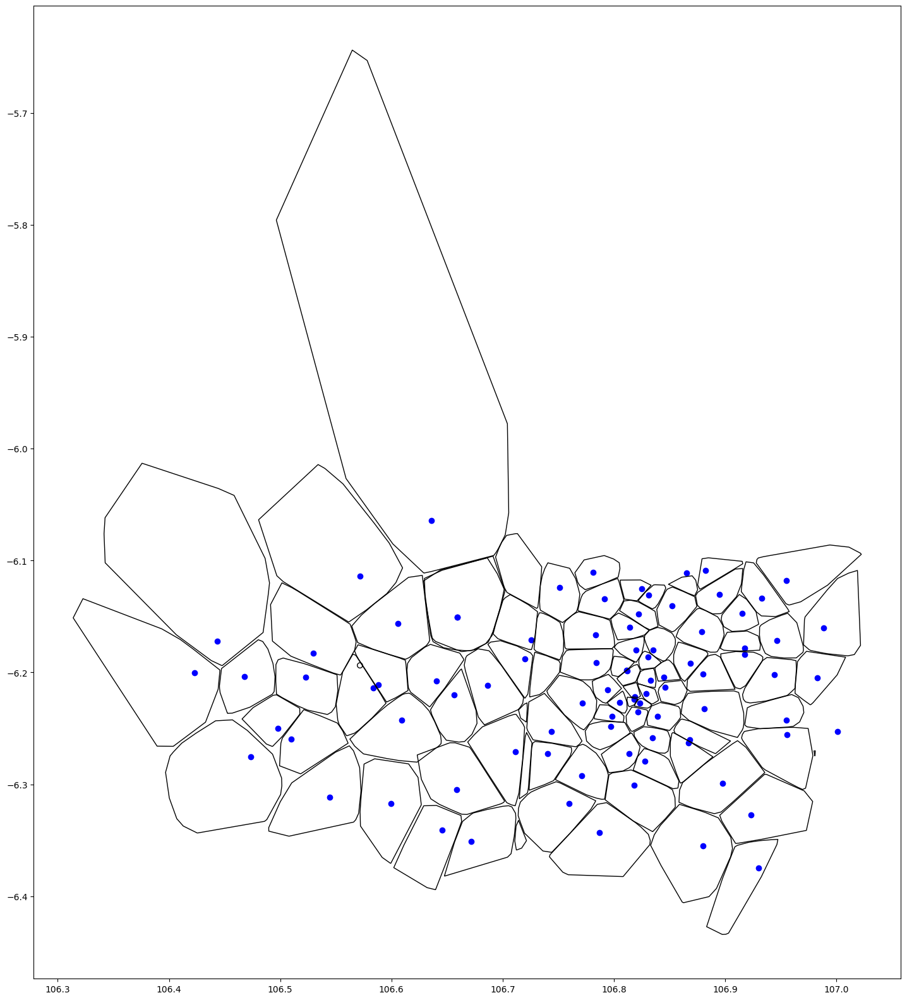

In [145]:
ax = ch_count.plot(figsize=(20, 20), color='none', edgecolor='black', zorder=3)
gi_gdf.plot(ax=ax, color='blue')

## Ovelay the data on map

In [146]:
m = ch_count.explore(color="purple", name="ClusterKmeans_ConvexHull")
m = gd_gdf.explore(m=m, color="lightgreen", name="Gardu Distribusi")
m = gi_gdf.explore(m=m, color="red", name="Gardu Induk")
m = ct_gdf.explore(m=m, color="blue", name="Rekomendasi GI")

folium.LayerControl().add_to(m)

m.save('K-Means_ConvexHull.html')
m